# News article Sentiment Analysis

# 1 Introduction

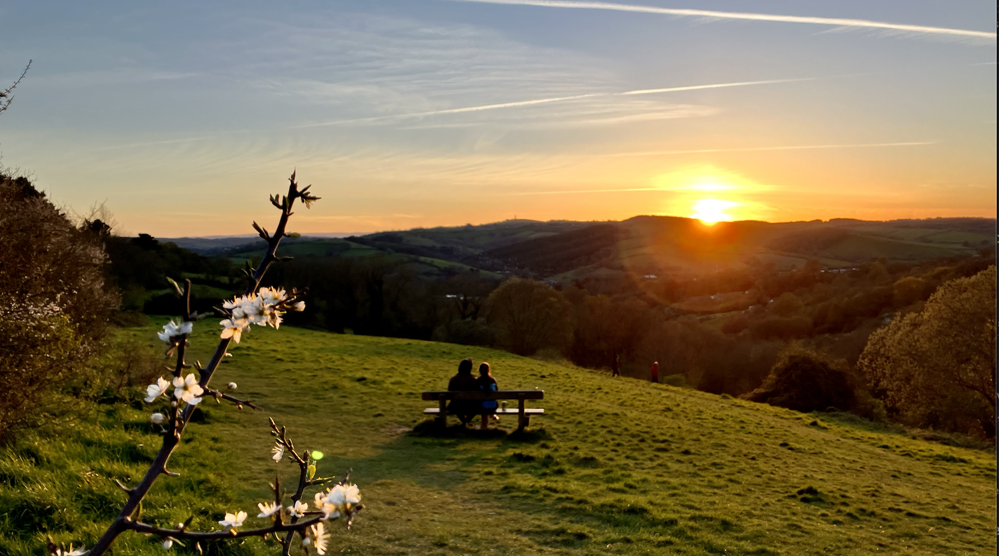

The term **Sentiment Analysis** was first defined in 2003 by Nasukawa and Yi as “determining the subjectivity polarity (positive or negative) and polarity strength (strongly positive, mildly positive, weakly positive etc.) of a given review text; in other words - determining the opinion of the writer.”

Balahur, A. et al. 2013. Sentiment analysis in the news

Sentiment analysis is utilized to investigate human emotions (i.e., sentiments) present in textual information. This paper presents a lexicon-based approach for sentiment analysis of news articles.

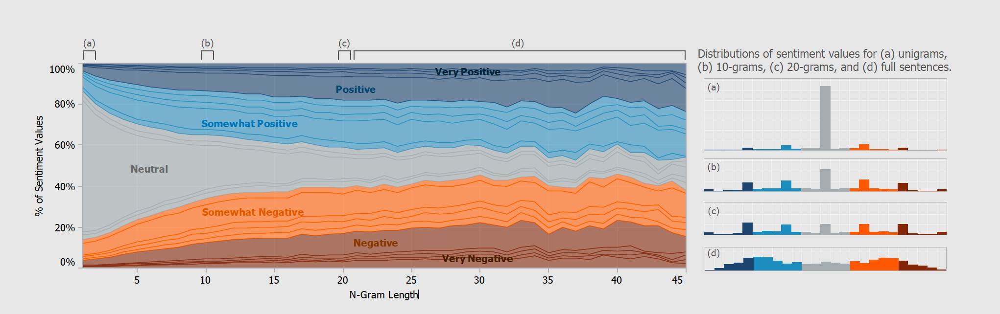

source:  <td> <a target="_blank" href="https://nlp.stanford.edu/~socherr/EMNLP2013_RNTN.pdf"> Recursive Deep Models for Semantic Compositionality
Over a Sentiment Treebank</a> 


 <a target="_blank" href="https://www.analyticsvidhya.com/blog/2021/09/what-are-n-grams-and-how-to-implement-them-in-python/"> n-gram</a> 

<td>
    

In [1]:
# from PIL import Image
# Image.open('data/Plutchik’s Wheel of Emotions.jpg').resize((700,650))
# # https://www.6seconds.org/2020/08/11/plutchik-wheel-emotions/

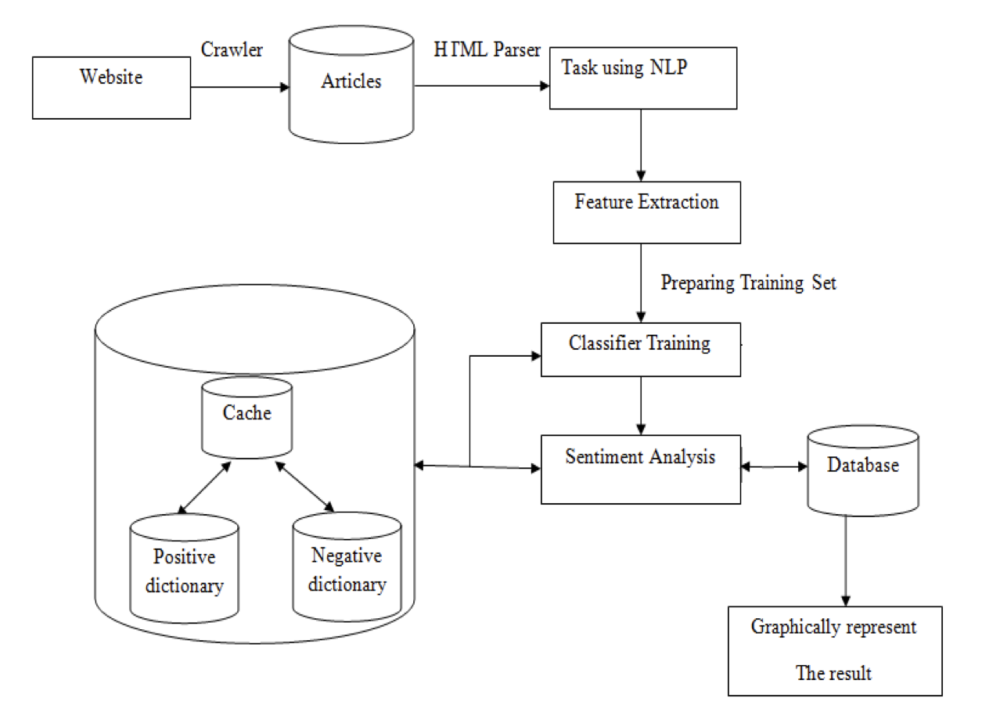

source: 
<td>
<a target="_blank" href="http://www.iraj.in/journal/journal_file/journal_pdf/12-127-1430132488114-116.pdf"> Analysis of news sentiments using natural language processing and deep learning</a> 

<td>

There are two popular approaches that are utilized to automate the process of sentiment analysis. 

* **The first** process makes use of a lexicon of weighted words

For lexicon based approach, Bag of Words (BOW) model along with General Inquirer Lexicon (H4N) was used to determine sentiment polarities.In this method, a labeled dictionary with positive and negative words is applied to a snippet of text and the sum of those values classifies this snippet as positive or negative. In a financial context, such a dictionary is provided by Loughran and McDonald (2011) and contains more than 4000 labeled words constructed from a financial point of view.

**Lexicon based methods** use a word stock dictionary with opinion words and match given set of words in a text for finding polarity.

(1). **Dictionary-based methods**: in these methods lexicon dictionary is used in order to find out the positive opinion words and negative opinion words.

(2). **Corpus-based methods**: in these methods large corpus of words is used and based on syntactic patterns other opinion words can be found within the context.

* **The second** process is based on approaches of machine learning.

These are representations for text where words that have the same meaning have a similar representation. Combining this with an NLP method such as **Google’s BERT (Bidirectional Encoder Representations from Transformers)**, one can combine this broader knowledge of the language with sentiment weights for sentences so that the model learns when to interpret a certain sentence as positive and when as negative, using neural networks.

For **machine learning** approach, Parts of Speech (POS) syntactic model was used.

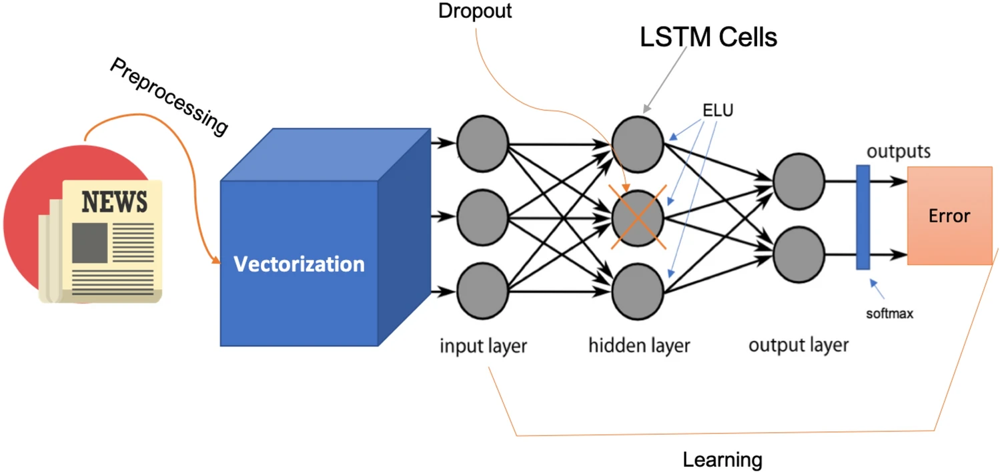


Image source: <td><a target="_blank" href="https://link.springer.com/article/10.1007/s00146-020-01111-x"> Analysis of news sentiments using natural language processing and deep learning</a> 
<td>

# 2 Dataset/News Sources:

* **BBC News**: 

Consists of 2225 documents from the BBC news website corresponding to stories in five topical areas from 2004-2005.

Class Labels: 5 (business, entertainment, politics, sport, tech)
    http://mlg.ucd.ie/datasets/bbc.html
    
* **Bing News Search** <td> <a target="_blank" href="https://medium.com/the-era-of-apis/news-sentiment-analysis-summarization-using-the-bing-news-search-api-aylientext-analysis-api-feb0331b2db7"> Bing</a> 

<td>
    
* **Google News**

    
* **Refinitive Eikon**

`get_news_headlines`: Returns a list of news headlines satisfying a query

`get_news_story` returns a HTML representation of the full news article

* **FinViz** https://finviz.com/news.ashx


In [1]:
# Import libraries
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from urllib.request import urlopen
from urllib.request import Request
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from PIL import Image

import numpy as np
from textblob import TextBlob
import datetime
from datetime import time
import warnings
warnings.filterwarnings("ignore")

from IPython import display
import math
from pprint import pprint
import nltk
import matplotlib.pyplot as plt


# The bellow are needed to plot graphs of all kinds
import plotly
import plotly.express as px
import plotly.graph_objects as go
import cufflinks as cf
cf.set_config_file(offline=True)

import chart_studio

import requests
import time

In [6]:
# df = pd.read_csv('data/geo_dataset.csv')
# df = df.iloc[:,1:]
# df.head(1)

In [7]:
df = pd.read_csv('data/re_geo_dataset.csv',index_col=0)

In [8]:
df = df.query('sentiment_value.notnull()')

In [9]:
df = df.reset_index()
df = df.iloc[:,1:]

In [10]:
# GPR_NEWS_GEO = pd.read_csv('data/GPR_NEWS_GEO.csv')
# GPR_NEWS_GEO = GPR_NEWS_GEO.iloc[:,1:]
# GPR_NEWS_GEO

In [11]:
df.isnull().sum()

title                  0
description            8
content                0
primary_country        0
political_risk         0
secondary_country    136
sentiment_value        0
dtype: int64

In [12]:
df = df.query('title==title')

In [13]:
df.isnull().sum()

title                  0
description            8
content                0
primary_country        0
political_risk         0
secondary_country    136
sentiment_value        0
dtype: int64

In [14]:
title = set(df.title)

In [15]:
df.title

0      Syria's main Druze city sees more unrest, call...
1      Sudan: Burhan dismisses sanctions threats, lau...
2      Thousands protest in UkraineÕs Kharkiv against...
3      Arrests made as Israeli lawmaker visits East J...
4      Israeli police try to contain violence in east...
                             ...                        
402    Calm returns as clean-up begins in Solomon Isl...
403    Taliban call on Biden to reverse move to halve...
404    Ethiopian prime minister in UAE as Tigray war ...
405    Niger accepts foreign special forces to secure...
406    Ethiopian Sugar Plant Stops Work After Attack ...
Name: title, Length: 407, dtype: object

In [16]:
content= set(df.content)

* **VADER**

VADER ( Valence Aware Dictionary for Sentiment Reasoning) is a model used for text sentiment analysis that is sensitive to both polarity (positive/negative) and intensity (strength) of emotion.

* **Textblob** sentiment analyzer returns two properties for a given input sentence:

Polarity is a float that lies between [-1,1], -1 indicates negative sentiment and +1 indicates positive sentiments.
Subjectivity is also a float that lies in the range of [0,1]. Subjective sentences generally refer to opinion, emotion, or judgment.

In [17]:
import nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/jason/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [18]:
df.title[1]

'Sudan: Burhan dismisses sanctions threats, lauds ties with Israel'

In [19]:
sia = SIA()
sia.polarity_scores(df.title[1])

{'neg': 0.259, 'neu': 0.741, 'pos': 0.0, 'compound': -0.4215}

In [20]:
sia = SIA()
sia.polarity_scores(df.content[1])

{'neg': 0.105, 'neu': 0.83, 'pos': 0.065, 'compound': -0.9366}

In [21]:
sia = SIA()
results = []

for i in df.index.to_list():
    line = df.title[i]
    pol_score = sia.polarity_scores(line)
    pol_score['title'] = line
    results.append(pol_score)

pprint(results[:3], width=100)

[{'compound': -0.2263,
  'neg': 0.147,
  'neu': 0.853,
  'pos': 0.0,
  'title': "Syria's main Druze city sees more unrest, calls for Friday protests - Reuters"},
 {'compound': -0.4215,
  'neg': 0.259,
  'neu': 0.741,
  'pos': 0.0,
  'title': 'Sudan: Burhan dismisses sanctions threats, lauds ties with Israel'},
 {'compound': -0.6597,
  'neg': 0.474,
  'neu': 0.526,
  'pos': 0.0,
  'title': 'Thousands protest in UkraineÕs Kharkiv against Russian threat'}]


In [22]:
sa_df = pd.DataFrame.from_records(results)
sa_df.head()

,neg,neu,pos,compound,title
0,0.147,0.853,0.0,-0.2263,"Syria's main Druze city sees more unrest, call..."
1,0.259,0.741,0.0,-0.4215,"Sudan: Burhan dismisses sanctions threats, lau..."
2,0.474,0.526,0.0,-0.6597,Thousands protest in UkraineÕs Kharkiv against...
3,0.266,0.734,0.0,-0.4404,Arrests made as Israeli lawmaker visits East J...
4,0.339,0.661,0.0,-0.6249,Israeli police try to contain violence in east...


In [23]:
sa_df.head(20)

,neg,neu,pos,compound,title
0,0.147,0.853,0.000,-0.2263,"Syria's main Druze city sees more unrest, call..."
1,0.259,0.741,0.000,-0.4215,"Sudan: Burhan dismisses sanctions threats, lau..."
2,0.474,0.526,0.000,-0.6597,Thousands protest in UkraineÕs Kharkiv against...
3,0.266,0.734,0.000,-0.4404,Arrests made as Israeli lawmaker visits East J...
4,0.339,0.661,0.000,-0.6249,Israeli police try to contain violence in east...
5,0.259,0.741,0.000,-0.5994,WaPo Claims US to Accuse Russia of Plotting a ...
6,0.000,0.682,0.318,0.4215,"Russian army, Putin's favoured foreign policy ..."
7,0.138,0.862,0.000,-0.1531,West Africa's political system could see 'comp...
8,0.000,0.682,0.318,0.4215,"Russian army, Putin's favoured foreign policy ..."
9,0.160,0.840,0.000,-0.2263,"Syria's main Druze city sees more unrest, call..."


In [24]:
sa_df['label'] = 0
sa_df.loc[sa_df['compound'] > 0.2, 'label'] = 1
sa_df.loc[sa_df['compound'] < -0.2, 'label'] = -1
sa_df.head()

,neg,neu,pos,compound,title,label
0,0.147,0.853,0.0,-0.2263,"Syria's main Druze city sees more unrest, call...",-1
1,0.259,0.741,0.0,-0.4215,"Sudan: Burhan dismisses sanctions threats, lau...",-1
2,0.474,0.526,0.0,-0.6597,Thousands protest in UkraineÕs Kharkiv against...,-1
3,0.266,0.734,0.0,-0.4404,Arrests made as Israeli lawmaker visits East J...,-1
4,0.339,0.661,0.0,-0.6249,Israeli police try to contain violence in east...,-1


In [25]:
df2 = sa_df[['title', 'label']]
df2.to_csv('data/sa_news_title.csv', mode='a', encoding='utf-8', index=False)

In [26]:
print("Positive headlines:\n")
pprint(list(sa_df[sa_df['label'] == 1].title)[:5], width=200)

print("\nNegative headlines:\n")
pprint(list(sa_df[sa_df['label'] == -1].title)[:5], width=200)

Positive headlines:

["Russian army, Putin's favoured foreign policy tool",
 "Russian army, Putin's favoured foreign policy tool",
 'U.S. Security Assistance to Burkina Faso Laid the Groundwork for a Coup',
 'Africa: Focus on Rights, Justice at Summit - African Union',
 "Russian army, Putin's favoured foreign policy tool"]

Negative headlines:

["Syria's main Druze city sees more unrest, calls for Friday protests - Reuters",
 'Sudan: Burhan dismisses sanctions threats, lauds ties with Israel',
 'Thousands protest in UkraineÕs Kharkiv against Russian threat',
 'Arrests made as Israeli lawmaker visits East Jerusalem flashpoint',
 'Israeli police try to contain violence in east Jerusalem']


In [27]:
sa_df.head(10)

,neg,neu,pos,compound,title,label
0,0.147,0.853,0.000,-0.2263,"Syria's main Druze city sees more unrest, call...",-1
1,0.259,0.741,0.000,-0.4215,"Sudan: Burhan dismisses sanctions threats, lau...",-1
2,0.474,0.526,0.000,-0.6597,Thousands protest in UkraineÕs Kharkiv against...,-1
3,0.266,0.734,0.000,-0.4404,Arrests made as Israeli lawmaker visits East J...,-1
4,0.339,0.661,0.000,-0.6249,Israeli police try to contain violence in east...,-1
5,0.259,0.741,0.000,-0.5994,WaPo Claims US to Accuse Russia of Plotting a ...,-1
6,0.000,0.682,0.318,0.4215,"Russian army, Putin's favoured foreign policy ...",1
7,0.138,0.862,0.000,-0.1531,West Africa's political system could see 'comp...,0
8,0.000,0.682,0.318,0.4215,"Russian army, Putin's favoured foreign policy ...",1
9,0.160,0.840,0.000,-0.2263,"Syria's main Druze city sees more unrest, call...",-1


In [28]:
# print(df.content.value_counts())

# print(df.content.value_counts(normalize=True) * 100)

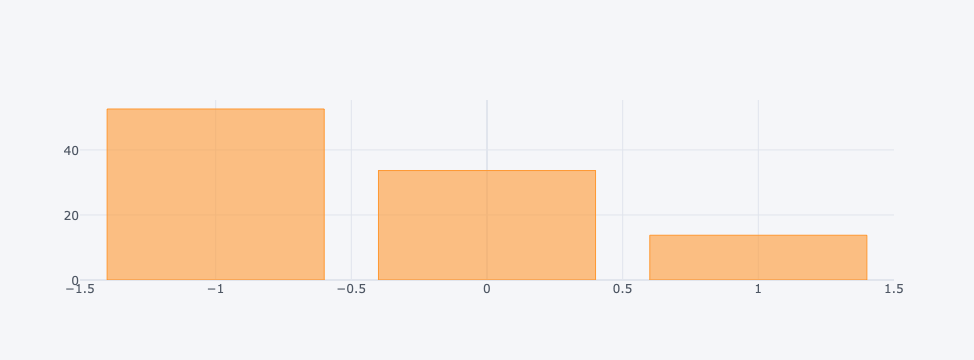

In [29]:
counts = sa_df.label.value_counts(normalize=True) * 100

# fig, ax = plt.subplots(figsize=(8, 8))
# sns.barplot(x=counts.index, y=counts, ax=ax)
# ax.set_xticklabels(['Negative', 'Neutral', 'Positive'])
# ax.set_ylabel("Percentage")
# plt.show()

counts.iplot(kind = 'bar')

pre-processing

In [30]:
from nltk.tokenize import word_tokenize, RegexpTokenizer
from nltk.corpus import stopwords

In [31]:
stop_words = stopwords.words('english')

def process_text(headlines):
    tokens = []
    for line in headlines:
        tokenizer = RegexpTokenizer(r'\w+')
        toks = tokenizer.tokenize(line)
        toks = [t.lower() for t in toks if t.lower() not in stop_words]
        tokens.extend(toks)
    
    return tokens

In [32]:
pos_lines = list(sa_df[sa_df.label == 1].title)
pos_tokens = process_text(pos_lines)
pos_freq = nltk.FreqDist(pos_tokens)
pos_freq.most_common(20)

[('security', 12),
 ('russia', 12),
 ('u', 8),
 ('us', 8),
 ('putin', 7),
 ('russian', 6),
 ('ukraine', 6),
 ('reuters', 6),
 ('says', 6),
 ('biden', 5),
 ('foreign', 4),
 ('border', 4),
 ('military', 4),
 ('kazakhstan', 4),
 ('army', 3),
 ('favoured', 3),
 ('policy', 3),
 ('tool', 3),
 ('africa', 3),
 ('asks', 3)]

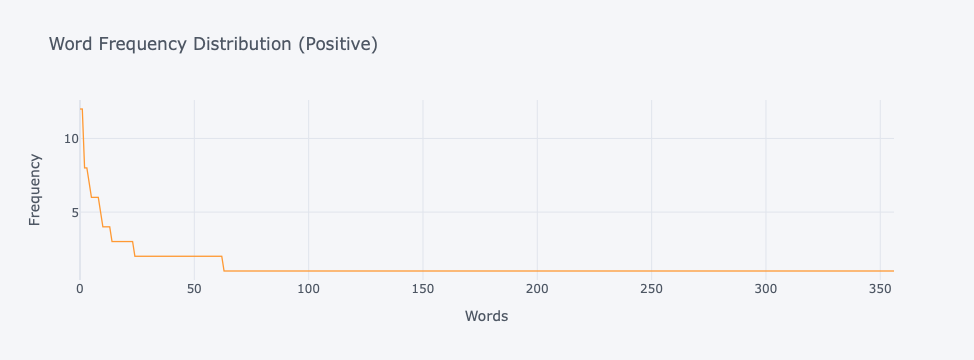

In [33]:
y_val = [x[1] for x in pos_freq.most_common()]
pd.DataFrame(y_val).iplot(title = 'Word Frequency Distribution (Positive)',
                         xaxis_title='Words',
                         yaxis_title='Frequency')

In [34]:
neg_lines = list(df2[df2.label == -1].title)
neg_tokens = process_text(neg_lines)
neg_freq = nltk.FreqDist(neg_tokens)
neg_freq.most_common(20)

[('ukraine', 40),
 ('russia', 36),
 ('us', 35),
 ('reuters', 21),
 ('war', 21),
 ('u', 19),
 ('crisis', 15),
 ('amid', 15),
 ('attack', 12),
 ('border', 12),
 ('killed', 12),
 ('belarus', 12),
 ('says', 12),
 ('syria', 11),
 ('beijing', 11),
 ('protests', 10),
 ('russian', 10),
 ('police', 10),
 ('invasion', 10),
 ('forces', 10)]

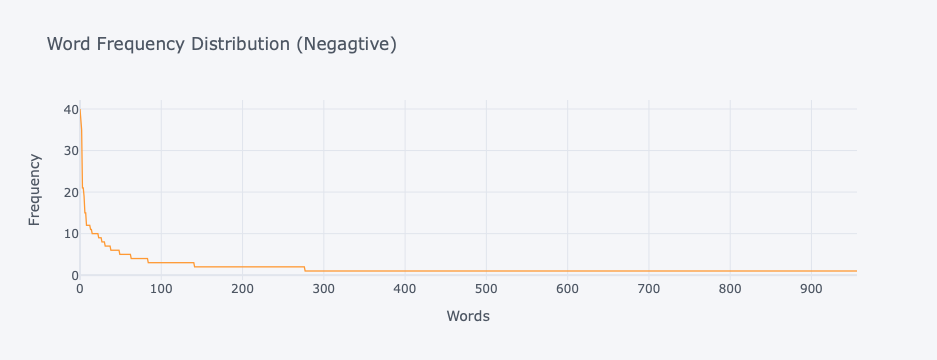

In [35]:
y_val = [x[1] for x in neg_freq.most_common()]
pd.DataFrame(y_val).iplot(title = 'Word Frequency Distribution (Negagtive)',
                             xaxis_title='Words',
                             yaxis_title='Frequency')

# 3 Evaluate Models for Sentiment Analysis

In [36]:
#NLP libraries
from textblob import TextBlob
import spacy
import nltk
import warnings
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
import csv
import pandas as pd

#Run the command python -m spacy download en_core_web_sm to download this
#https://spacy.io/models
import en_core_web_lg
nlp = en_core_web_lg.load()

#Libraries for processing the news headlines
from lxml import etree
import json
from io import StringIO
from os import listdir
from os.path import isfile, join
from pandas.tseries.offsets import BDay
from scipy.stats.mstats import winsorize
from copy import copy

# Libraries for Classification for modeling the sentiments
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Keras package for the deep learning model for the sentiment prediction. 
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense, Flatten, LSTM, Dropout, Activation
from keras.layers.embeddings import Embedding

# Load libraries
import statsmodels.api as sm
import pandas as pd
import numpy as np
import datetime
from datetime import date

#Additional Libraries 
import json  
import zipfile
import os.path
import sys

# Visualization
import plotly
import plotly.graph_objects as go
import chart_studio.plotly as py
import plotly.io as pio
import plotly.express as px

import plotly.offline as py
py.init_notebook_mode()
import cufflinks

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/jason/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [37]:
# df1 = pd.read_csv('data/geo_dataset.csv')
# df1 = df1.iloc[:,1:]
# df1.to_excel('data/geo_dataset.xlsx')

In [38]:
# df = pd.read_csv('data/geo_dataset.csv')
# df = df.iloc[:,1:]
# df.head(1)

In [39]:
from Utilities.combine_columns import Combine_Col

df = Combine_Col(dataset = df, col_1='title',col_2 = 'description')
df.head(1)

,title_description,title,description,content,primary_country,political_risk,secondary_country,sentiment_value
0,"Syria's main Druze city sees more unrest, call...","Syria's main Druze city sees more unrest, call...",Tens of Syrian protesters gathered on Thursday...,"AMMAN, Feb 10 (Reuters) - Tens of Syrian prote...",Syria,1.0,NaN,Negative


In [88]:
# import self defined modules
from Utilities.pre_processing import Pre_Processing_GEO
from Utilities.Deep_Clean import Pre_Processing_Deep

In [41]:
%%capture
# TDC is short for Title, Description and Content
df['TD'] = df['title_description'].apply(lambda x: Pre_Processing_GEO(x))

In [42]:
df['Con'] = df['content'].apply(lambda x: Pre_Processing_GEO(x))

In [91]:
%%time
df['Content_DC'] = df['content'].apply(lambda x: Pre_Processing_Deep(x))

CPU times: user 48.2 s, sys: 12 ms, total: 48.2 s
Wall time: 48.2 s


In [89]:
df.shape

(407, 15)

## 3.1  Predefined model-TextBlob package


In [43]:
text1 = df.title[1]
text1 

'Sudan: Burhan dismisses sanctions threats, lauds ties with Israel'

In [44]:
TextBlob(text1).sentiment.polarity

0.0

The sentiment polarity is a number between -1 (Very Negative) and +1 (Very Positive).

In [45]:
TextBlob(text1).sentiment_assessments

Sentiment(polarity=0.0, subjectivity=0.0, assessments=[])

In [46]:
df['TextBlob_TD'] = [TextBlob(s).sentiment.polarity for s in df['TD']] 

In [47]:
df['TextBlob_Con'] = [TextBlob(s).sentiment.polarity for s in df['Con']] 

In [48]:
df.head(1)

,title_description,title,description,content,primary_country,political_risk,secondary_country,sentiment_value,TD,Con,TextBlob_TD,TextBlob_Con
0,"Syria's main Druze city sees more unrest, call...","Syria's main Druze city sees more unrest, call...",Tens of Syrian protesters gathered on Thursday...,"AMMAN, Feb 10 (Reuters) - Tens of Syrian prote...",Syria,1.0,NaN,Negative,Syria s main Druze city sees more unrest calls...,AMMAN Feb Reuters Tens of Syrian protesters ga...,0.172222,0.049513


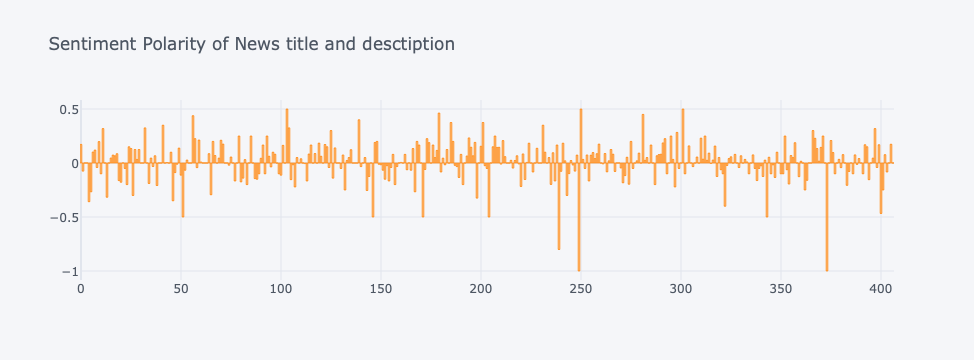

In [49]:
df[['TextBlob_TD']].iplot(kind='bar',title='Sentiment Polarity of News title and desctiption')

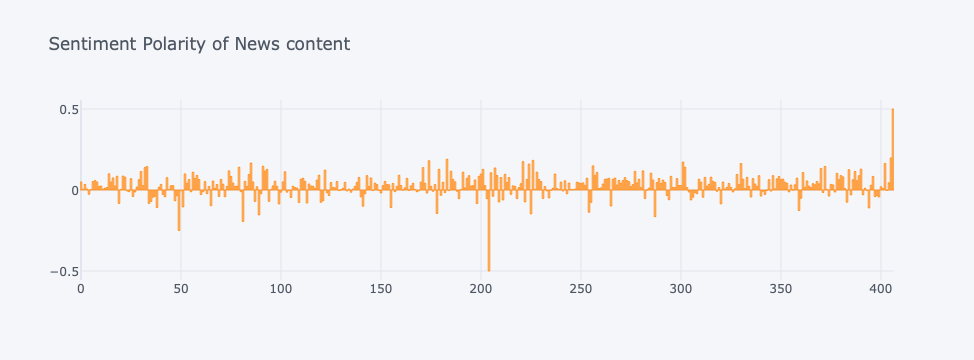

In [50]:
df[['TextBlob_Con']].iplot(kind='bar',title='Sentiment Polarity of News content')

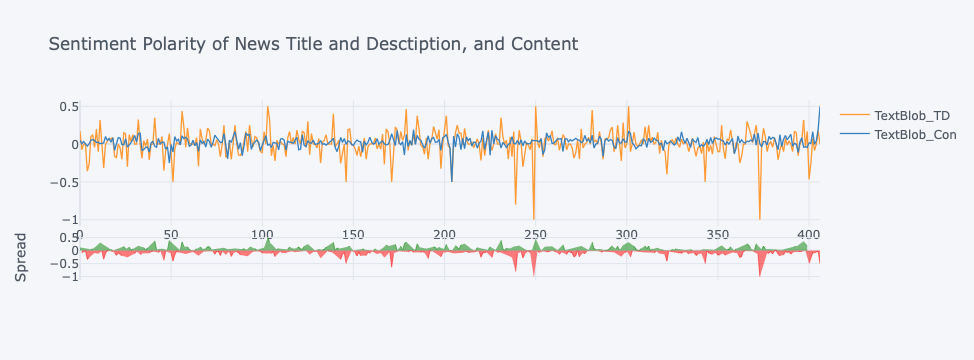

In [51]:
df[['TextBlob_TD','TextBlob_Con']].iplot(kind='spread',title='Sentiment Polarity of News Title and Desctiption, and Content')

## 3.2  Unsupervised - Model based on lexicon

In [52]:
sia = SentimentIntensityAnalyzer()

In [53]:
df.TD[0]

'Syria s main Druze city sees more unrest calls for Friday protests ReutersTens of Syrian protesters gathered on Thursday in the mainly Druze city of Sweida to protest against worsening economic conditions and subsidy cuts that came into force last week residents activists and local officials said on Thursday'

In [54]:
%%time
sia.polarity_scores(df.TD[0])['compound']

CPU times: user 1.28 ms, sys: 0 ns, total: 1.28 ms
Wall time: 1.29 ms


-0.8402

In [55]:
1.13*1347/1000

1.5221099999999999

In [87]:
from Utilities.Deep_Clean import Pre_Processing_Deep

In [56]:
df['sia_TD'] = [sia.polarity_scores(s)['compound'] for s in df['TD']] 

In [57]:
df['sia_Con'] = [sia.polarity_scores(s)['compound'] for s in df['Con']] 

In [92]:
df['sia_Con_DC'] = [sia.polarity_scores(s)['compound'] for s in df['Content_DC']] 

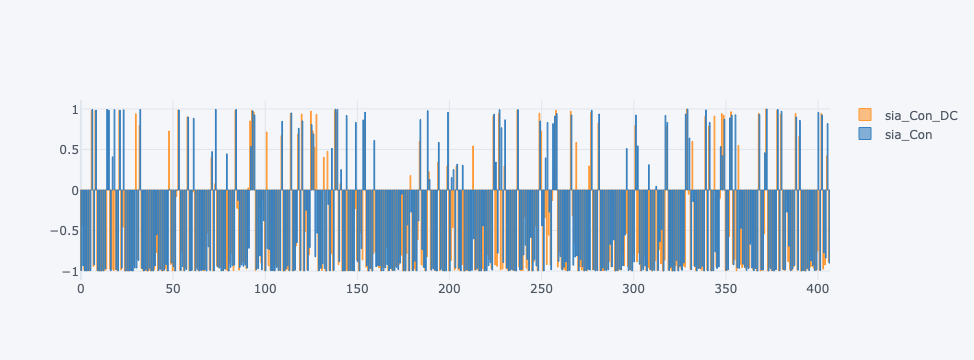

In [93]:
df[['sia_Con_DC','sia_Con']].iplot(kind='bar')

In [97]:
df.query('sia_Con_DC < 0').shape[0]/len(df),df.query('sia_Con < 0').shape[0]/len(df)

(0.828009828009828, 0.7862407862407862)

In [99]:
df.query('sia_Con_DC < 0 and sia_Con>0').shape[0]

32

In [100]:
df.head(1)

,title_description,title,description,content,primary_country,political_risk,secondary_country,sentiment_value,TD,Con,TextBlob_TD,TextBlob_Con,sia_TD,sia_Con,bert_title,Content_DC,sia_Con_DC
0,"Syria's main Druze city sees more unrest, call...","Syria's main Druze city sees more unrest, call...",Tens of Syrian protesters gathered on Thursday...,"AMMAN, Feb 10 (Reuters) - Tens of Syrian prote...",Syria,1.0,NaN,Negative,Syria s main Druze city sees more unrest calls...,AMMAN Feb Reuters Tens of Syrian protesters ga...,0.172222,0.049513,-0.8402,-0.9941,-0.997812,protester gather mainly city protest worsen ec...,-0.9902


In [101]:
df.query('sia_Con_DC < 0 and bert_title>0').shape[0]

89

In [102]:
df.query('sia_Con < 0 and bert_title>0').shape[0]

85

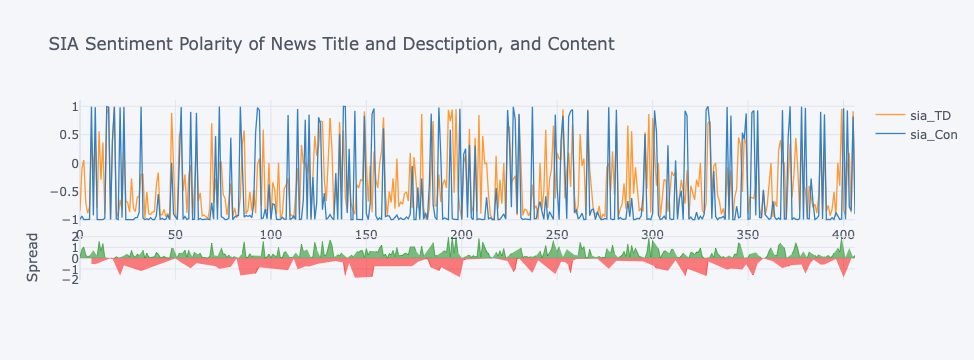

In [58]:
df[['sia_TD','sia_Con']].iplot(kind='spread',title='SIA Sentiment Polarity of News Title and Desctiption, and Content')

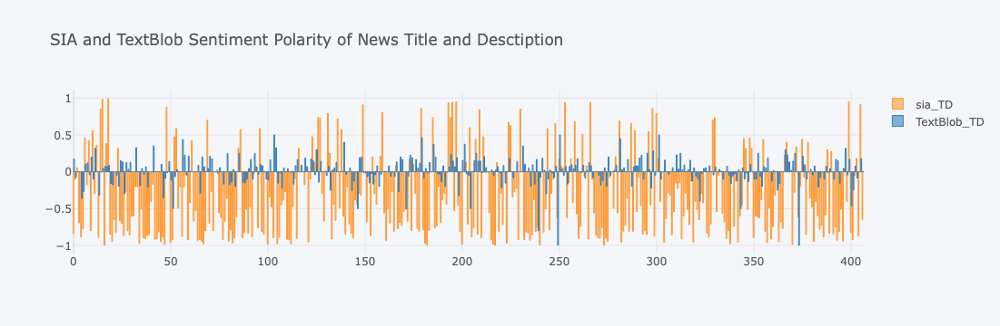

In [59]:
df[['sia_TD','TextBlob_TD']].iplot(kind='bar',title='SIA and TextBlob Sentiment Polarity of News Title and Desctiption')

In [60]:
len(df.query('sia_TD<0'))/len(df),len(df.query('TextBlob_TD<0'))/len(df)

(0.7248157248157249, 0.343980343980344)

In [61]:
len(df.query('sia_Con<0'))/len(df),len(df.query('TextBlob_Con<0'))/len(df)

(0.7862407862407862, 0.29238329238329236)

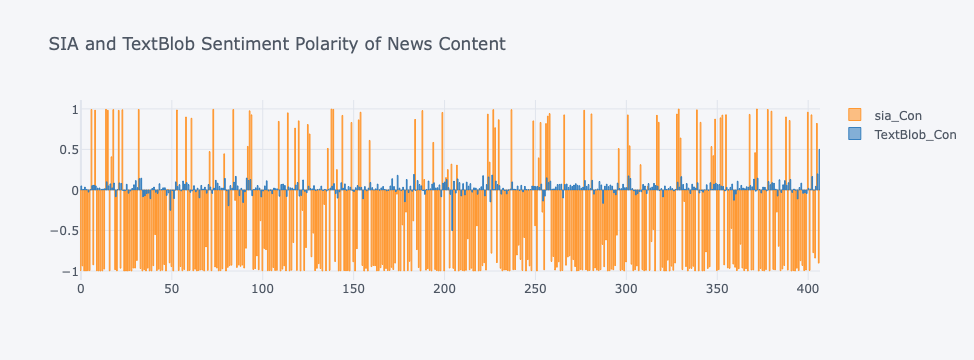

In [62]:
df[['sia_Con','TextBlob_Con']].iplot(kind='bar',title='SIA and TextBlob Sentiment Polarity of News Content')

## 3.3 Pretrained Deep Learning Model

DistilBERT base uncased finetuned SST-2

This model is a fine-tune checkpoint of DistilBERT-base-uncased, fine-tuned on SST-2. This model reaches an accuracy of 91.3 on the dev set (for comparison, Bert bert-base-uncased version reaches an accuracy of 92.7).

📝 Text
**Transformer**
https://huggingface.co/docs/transformers/index



In [63]:
from transformers import T5Tokenizer, T5Config, T5ForConditionalGeneration
from transformers import pipeline

In [64]:
pipe = pipeline('sentiment-analysis',model="AnonymousSub/news_pretrain_bert_FT_new_newsqa")
pipe(df.TD[1])

Some weights of the model checkpoint at AnonymousSub/news_pretrain_bert_FT_new_newsqa were not used when initializing BertForSequenceClassification: ['qa_outputs.weight', 'qa_outputs.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at AnonymousSub/news_pretrain_bert_FT_new_newsqa and are newly initialized: ['classifier.weight', 'bert.pooler.dense.weight', 'bert.pooler.dense.bias', 'classifier.bias']
You should probably TRAIN this model on a down-stream

[{'label': 'LABEL_1', 'score': 0.5903297662734985}]

In [65]:
df.TD[1]

'Sudan Burhan dismisses sanctions threats lauds ties with IsraelThe military leader says intelligence sharing between Tel Aviv and Khartoum helped arrest suspected fighters in Sudan'

In [66]:
pipeline('sentiment-analysis',model="siebert/sentiment-roberta-large-english")(df.TD[1])

[{'label': 'POSITIVE', 'score': 0.9984875917434692}]

In [67]:
df.TD[2]

'Thousands protest in UkraineÕs Kharkiv against Russian threatThousands march through the city chanting Kharkiv is Ukraine in show of solidarity with country'

In [68]:
pipeline('sentiment-analysis',model="siebert/sentiment-roberta-large-english")(df.TD[2])

[{'label': 'POSITIVE', 'score': 0.9986929297447205}]

In [69]:
bert_sa = pipeline('sentiment-analysis',model="siebert/sentiment-roberta-large-english")
bert_sa(df.TD[1])

[{'label': 'POSITIVE', 'score': 0.9984875917434692}]

In [86]:
bert_sa(df.title[0])

[{'label': 'NEGATIVE', 'score': 0.9978118538856506}]

In [71]:
bert_sa = pipeline('sentiment-analysis',model="siebert/sentiment-roberta-large-english")

In [72]:
def pipeline_SA(text):  
    pl  = bert_sa(text)
    df_pl = pd.DataFrame.from_dict(pl[0], orient='index').T
    
    for index, row in df_pl.iterrows():
        label = row['label']
        score = row['score']
        
        if label == 'NEGATIVE':
            score = -score
            
    return score

In [73]:
%%time
pipeline_SA(df.TD[1])

CPU times: user 2.15 s, sys: 0 ns, total: 2.15 s
Wall time: 136 ms


0.9984875917434692

In [74]:
# %%time
# df['bert_TD'] = df['TD'].apply(lambda x : pipeline_SA(x))

In [75]:
%%time
df['bert_title'] = df['title'].apply(lambda x : pipeline_SA(x))

CPU times: user 6min 17s, sys: 113 ms, total: 6min 17s
Wall time: 23.6 s


In [76]:
# df['bert_content'] = df['content'].apply(lambda x : pipeline_SA(x))

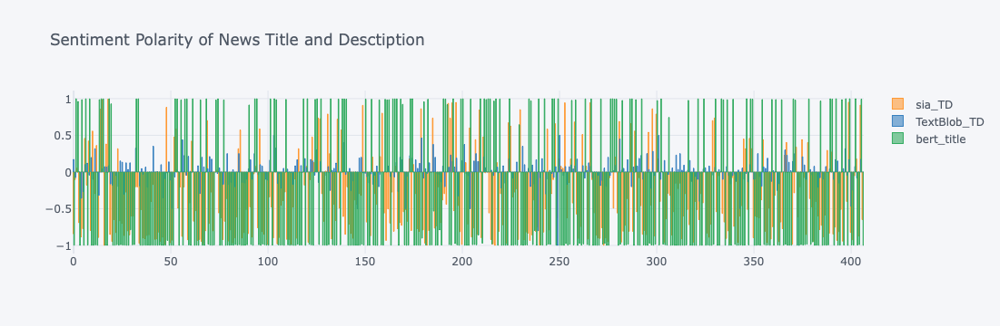

In [77]:
df[['sia_TD','TextBlob_TD','bert_title']].iplot(kind='bar',title='Sentiment Polarity of News Title and Desctiption')

In [78]:
len(df.query('sia_TD < 0'))/len(df)

0.7248157248157249

In [79]:
len(df.query('bert_title < 0'))/len(df)

0.6977886977886978

## 3.3 Fhamborg Roberta 

fhamborg/roberta-targeted-sentiment-classification-newsarticles

Paper https://aclanthology.org/2021.eacl-main.142.pdf

In [1]:
from NewsSentiment import TargetSentimentClassifier
tsc = TargetSentimentClassifier()

Some weights of the model checkpoint at roberta-base were not used when initializing RobertaModel: ['lm_head.decoder.weight', 'lm_head.layer_norm.bias', 'lm_head.dense.bias', 'lm_head.bias', 'lm_head.layer_norm.weight', 'lm_head.dense.weight']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [2]:
sentiment = tsc.infer_from_text("I like " ,"Peter", " but I don't like Robert.")
print(sentiment[0])

sentiment = tsc.infer_from_text("" ,"Mark Meadows", "'s coverup of Trump’s coup attempt is falling apart.")
print(sentiment[0])

/home/jason/anaconda3/envs/JL/lib/python3.8/site-packages/transformers/tokenization_utils_base.py:2271: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


{'class_id': 1, 'class_label': 'neutral', 'class_prob': 0.48062431812286377}
{'class_id': 0, 'class_label': 'negative', 'class_prob': 0.9785571694374084}


In [3]:
left = 'Kazakh protesters beaten tortured after unrest'
target = 'HRW Kazakh security forces cracking down on unrest'
right = 'last month have arbitrarily arrested peaceful protesters illtreated and tortured detainees interfered with detainees access to lawyers Human Rights Watch says'
sentiment = tsc.infer_from_text(left, target, right)
sentiment

[{'class_id': 0, 'class_label': 'negative', 'class_prob': 0.606137752532959},
 {'class_id': 1, 'class_label': 'neutral', 'class_prob': 0.36187687516212463},
 {'class_id': 2, 'class_label': 'positive', 'class_prob': 0.03198534995317459}]

In [89]:
left = 'Kazakh protesters beaten tortured after unrest HRW Kazakh security forces cracking down on unrest last month'
target = 'have arbitrarily arrested peaceful protesters illtreated and tortured detainees'
right = 'interfered with detainees access to lawyers Human Rights Watch says'
sentiment = tsc.infer_from_text(left, target, right)
sentiment

[{'class_id': 0, 'class_label': 'negative', 'class_prob': 0.8633079528808594},
 {'class_id': 1, 'class_label': 'neutral', 'class_prob': 0.12338581681251526},
 {'class_id': 2, 'class_label': 'positive', 'class_prob': 0.01330615859478712}]

In [90]:
sia.polarity_scores(df.TD[0])['compound']

-0.8402

In [91]:
tsc_train = pd.read_json(path_or_buf='data/NewsMTSC/train.jsonl',lines=True)
tsc_train.shape

(7758, 3)

In [92]:
tsc_train.head(10)

,primary_gid,sentence_normalized,targets
0,allsides_1000_401_25_Reality Leigh Winner_0_6,Winner wrote that she had a 30-minute private ...,[{'Input.gid': 'allsides_1000_401_25_Reality L...
1,allsides_1000_401_3_Reality Leigh Winner_0_3,She also recently referred to President Trump ...,[{'Input.gid': 'allsides_1000_401_3_Reality Le...
2,allsides_1018_408_1_Hillary Clinton_2_17,Hillary Clinton blamed the Democratic National...,[{'Input.gid': 'allsides_1018_408_1_Hillary Cl...
3,allsides_1018_408_8_Hillary Clinton_77_84,(RELATED: The 44 Most Damning Stories From Wik...,[{'Input.gid': 'allsides_1018_408_8_WikiLeaks_...
4,allsides_1019_408_0_former Secretary of State ...,"Hillary Clinton takes ""responsibility"" for los...",[{'Input.gid': 'allsides_1019_408_0_former Sec...
5,allsides_1019_408_9_former Secretary of State ...,"Clinton also looked to social media, saying si...",[{'Input.gid': 'allsides_1019_408_9_former Sec...
6,allsides_101_41_7_President Donald Trump_0_5,"Trump's unhinged Twitter attacks, frequent off...",[{'Input.gid': 'allsides_101_41_7_President Do...
7,allsides_102_41_18_Bill Clinton_0_15,Hillary Clinton continues to face fire for all...,[{'Input.gid': 'allsides_102_41_18_Bill Clinto...
8,allsides_1031_412_3_Donald Trump's_0_5,Trump accepted Dubke’s offer to stay while on ...,[{'Input.gid': 'allsides_1031_412_3_Donald Tru...
9,allsides_1031_412_7_Donald Trump's_94_99,"“The reasons for my departure are personal, bu...",[{'Input.gid': 'allsides_1031_412_7_Donald Tru...


In [93]:
tsc_train.targets[0]

[{'Input.gid': 'allsides_1000_401_25_Reality Leigh Winner_0_6',
  'from': 0,
  'to': 6,
  'mention': 'Winner',
  'polarity': 4.0}]

In [94]:
devtest_mt = pd.read_json(path_or_buf='data/NewsMTSC/devtest_mt.jsonl',lines=True)

In [95]:
devtest_mt.shape

(721, 3)

In [96]:
devtest_mt.targets[7]

[{'Input.gid': 'allsides_1183_473_3_Assad_237_242',
  'from': 237,
  'to': 242,
  'mention': 'Assad',
  'polarity': 2.0},
 {'Input.gid': 'allsides_1183_473_3_Haley_74_79',
  'from': 74,
  'to': 79,
  'mention': 'Haley',
  'polarity': 4.0}]

In [97]:
devtest_rw = pd.read_json(path_or_buf='data/NewsMTSC/devtest_rw.jsonl',lines=True)

In [98]:
devtest_rw

,primary_gid,sentence_normalized,targets
0,allsides_703_283_55_Mr. Trump_124_133,A group of congressional Democrats said Wednes...,[{'Input.gid': 'allsides_703_283_55_Mr. Trump_...
1,allsides_5638_2408_14_Rob Portman of Ohio_209_216,"“I think he’s happy and, you know, proud that ...",[{'Input.gid': 'allsides_5638_2408_14_Rob Port...
2,allsides_2729_1110_19_Dana Perino_35_46,Click here for more information on Dana Perino.,[{'Input.gid': 'allsides_2729_1110_19_Dana Per...
3,polusa_v1_4291837_-1_0_then-President Barack O...,Stacey Dash Tells WalkAway Crowd Divisive Obam...,[{'Input.gid': 'polusa_v1_4291837_-1_0_then-Pr...
4,polusa_v1_18326787_-1_16_Business Secretary Gr...,"""The science has clearly hardened since the Cl...",[{'Input.gid': 'polusa_v1_18326787_-1_16_Busin...
...,...,...,...
1062,polusa_v1_4885368_-1_0_Deputy Australian Prime...,Deputy Australian Prime Minister Barnaby Joyce...,[{'Input.gid': 'polusa_v1_4885368_-1_0_Deputy ...
1063,polusa_v1_4021330_-1_16_Mr. Souza_78_87,"Alice Gabriner, the international photo editor...",[{'Input.gid': 'polusa_v1_4021330_-1_16_Mr. So...
1064,polusa_v1_53001849_-1_0_Austin_0_6,"Austin Tice, Jounalist Held In Syria, Is Alive...",[{'Input.gid': 'polusa_v1_53001849_-1_0_Austin...
1065,polusa_v1_4345315_-1_18_Clay Aiken_4_7,But her credibility is totally shot.,[{'Input.gid': 'polusa_v1_4345315_-1_18_Clay A...


# 4 Finalise Model

By comparing the performance of TextBlob, SIA and Bert Model, select SIA as sentiment analysis package.

The Sentiment polarity is divided in to five sub categories. 

* Strong Negtive **[-1, -0.6)**
* Negative **[-0.6, -0.2)**
* Netrual  **[-0.2, +0.2]**
* Positive **(+0.2, +0.6]**
* Strong Positive **(+0.6, +1]**

Divided polarity into five levels evenly


In [80]:
threshold1 = 0.2
threshold2 = 0.6

In [103]:
n_strong_positive = len(df.query('sia_Con <= 1 and sia_Con >  {j}'.format(j = threshold2)))
n_positive = len(df.query('sia_Con <= {i} and sia_Con > {j}'.format(i= threshold2, j = threshold1)))
n_netrual = len(df.query('sia_Con <= {i} and sia_Con >=  {j}'.format(i= threshold1, j = -threshold1)))
n_negative = len(df.query('sia_Con < {i} and sia_Con >= {j}'.format(i= -threshold1, j = -threshold2)))
n_strog_negative = len(df.query('sia_Con < {i} and sia_Con >= -1'.format(i = -threshold2 )))
if n_strong_positive + n_positive + n_netrual + n_negative + n_strog_negative == len(df):
    polarity = [n_strong_positive, n_positive, n_netrual, n_negative, n_strog_negative]
    df_polarity  = pd.DataFrame(polarity, index = ['strong_positive', 'positive', 'netrual', 'negative', 'strong_negative'],columns=['num'])
    df_polarity['percentage'] = df_polarity['num']/len(df)


In [104]:
df_polarity

,num,percentage
strong_positive,65,0.159705
positive,18,0.044226
netrual,9,0.022113
negative,15,0.036855
strong_negative,300,0.737101


In [105]:
labeled_sa = df[['title','sentiment_value']]
labeled_sa = labeled_sa.replace('Negative','negative')\
                       .replace('Strong negative','strong_negative')\
                       .replace('Neutral','netrual')\
                       .replace('Positive','positive')\
                        .replace('Strong positive','strong_positive')

In [106]:
labeled_sa_count = labeled_sa.groupby('sentiment_value').count().rename(columns={'title':'labelled_num'})

In [107]:
df_polarity_labelled = pd.concat([labeled_sa_count,df_polarity[['num']]],axis=1)
df_polarity_labelled

,labelled_num,num
negative,269.0,15
netrual,14.0,9
positive,22.0,18
strong_negative,102.0,300
strong_positive,NaN,65


In [114]:
df_polarity_labelled['sia_percentage'] = df_polarity_labelled['num']/len(df)
df_polarity_labelled['labelled_percentage'] = df_polarity_labelled['labelled_num']/len(df)

In [115]:
df_polarity_labelled

,labelled_num,num,sia_percentage,labelled_percentage
negative,269.0,15,0.036855,0.660934
netrual,14.0,9,0.022113,0.034398
positive,22.0,18,0.044226,0.054054
strong_negative,102.0,300,0.737101,0.250614
strong_positive,NaN,65,0.159705,NaN


TODO: diff 14%, adjust sentiment cut point

In [117]:
0.25+0.66

0.91

In [118]:
0.25+0.66 - (0.03+0.737)

0.14300000000000002

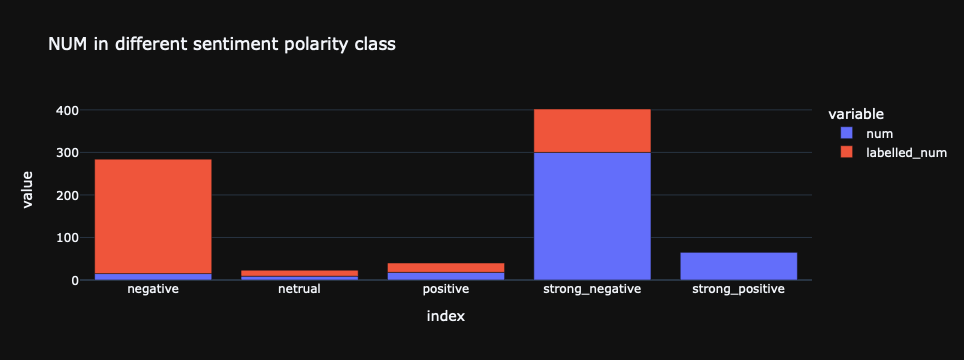

In [119]:
fig = px.bar(df_polarity_labelled[['num','labelled_num']],template = 'plotly_dark',
             title="NUM in different sentiment polarity class")
fig.show()

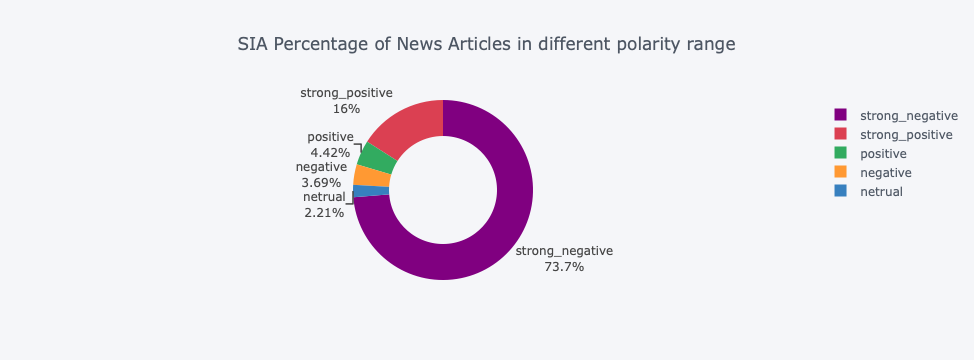

In [120]:
df_polarity_labelled.reset_index().iplot(kind='pie',
                                labels='index',
                                values = "sia_percentage",
                                textinfo='percent+label', 
                                hole=.6,title ='SIA Percentage of News Articles in different polarity range')

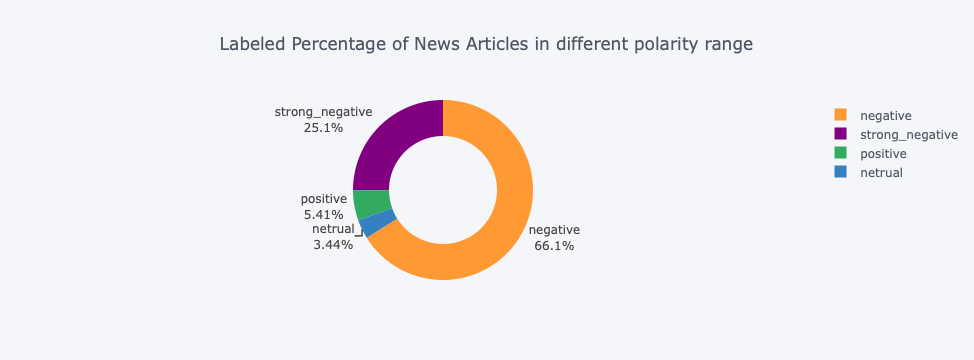

In [121]:
df_polarity_labelled.reset_index().iplot(kind='pie',
                                labels='index',
                                values = "labelled_percentage",
                                textinfo='percent+label', 
                                hole=.6,title ='Labeled Percentage of News Articles in different polarity range')

In [122]:
df.head(1)

,title_description,title,description,content,primary_country,political_risk,secondary_country,sentiment_value,TD,Con,TextBlob_TD,TextBlob_Con,sia_TD,sia_Con,bert_title
0,"Syria's main Druze city sees more unrest, call...","Syria's main Druze city sees more unrest, call...",Tens of Syrian protesters gathered on Thursday...,"AMMAN, Feb 10 (Reuters) - Tens of Syrian prote...",Syria,1.0,NaN,Negative,Syria s main Druze city sees more unrest calls...,AMMAN Feb Reuters Tens of Syrian protesters ga...,0.172222,0.049513,-0.8402,-0.9941,-0.997812


In [123]:
# df_sample = pd.read_csv('data/re_geo_dataset.csv',index_col=0)
# df_sample = df_sample.query('')

In [124]:
def sia_strenth_2_class(x,threshold1,threshold2):
    
    if x <= 1 and x > threshold2:
        return 'strong_positive'
    
    elif x <= threshold2 and x > threshold1:
        return 'positive'
    
    elif x <= threshold1 and x >= -threshold1:
        return 'netrual'
    
    elif x < -threshold1 and x >=  -threshold2:
        return 'negative'
    
    elif x < -threshold2 and x >= -1:
        return 'strong_negative'

In [125]:
df['sia_class'] = df['sia_Con'].apply(lambda x : sia_strenth_2_class(x,threshold1=0.2,threshold2=0.6))

In [126]:
df.head(1)

,title_description,title,description,content,primary_country,political_risk,secondary_country,sentiment_value,TD,Con,TextBlob_TD,TextBlob_Con,sia_TD,sia_Con,bert_title,sia_class
0,"Syria's main Druze city sees more unrest, call...","Syria's main Druze city sees more unrest, call...",Tens of Syrian protesters gathered on Thursday...,"AMMAN, Feb 10 (Reuters) - Tens of Syrian prote...",Syria,1.0,NaN,Negative,Syria s main Druze city sees more unrest calls...,AMMAN Feb Reuters Tens of Syrian protesters ga...,0.172222,0.049513,-0.8402,-0.9941,-0.997812,strong_negative


In [127]:
df9 = df[['title','sia_Con','sia_class']].iloc[:25,:]

In [128]:
df9['short_title'] =df9['title'].apply(lambda x: x[0:18])

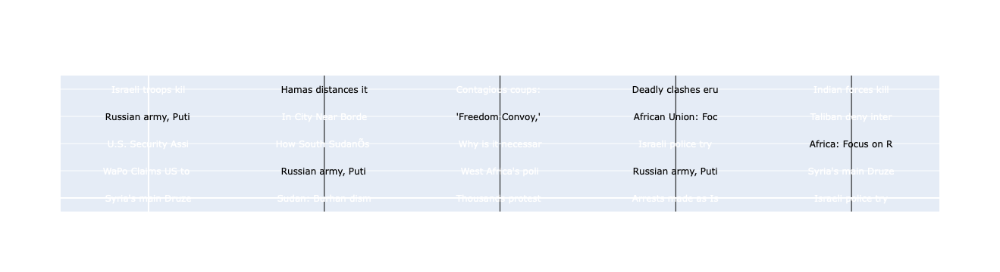

In [129]:
import plotly.figure_factory as ff

z = np.asarray(list(df9.sia_Con)).reshape(5,5)

z_text = np.asarray(list(df9.short_title)).reshape(5,5)

fig = ff.create_annotated_heatmap(z, annotation_text=z_text, colorscale='Viridis')
fig.show()

* Semantic_Topics_Matrix

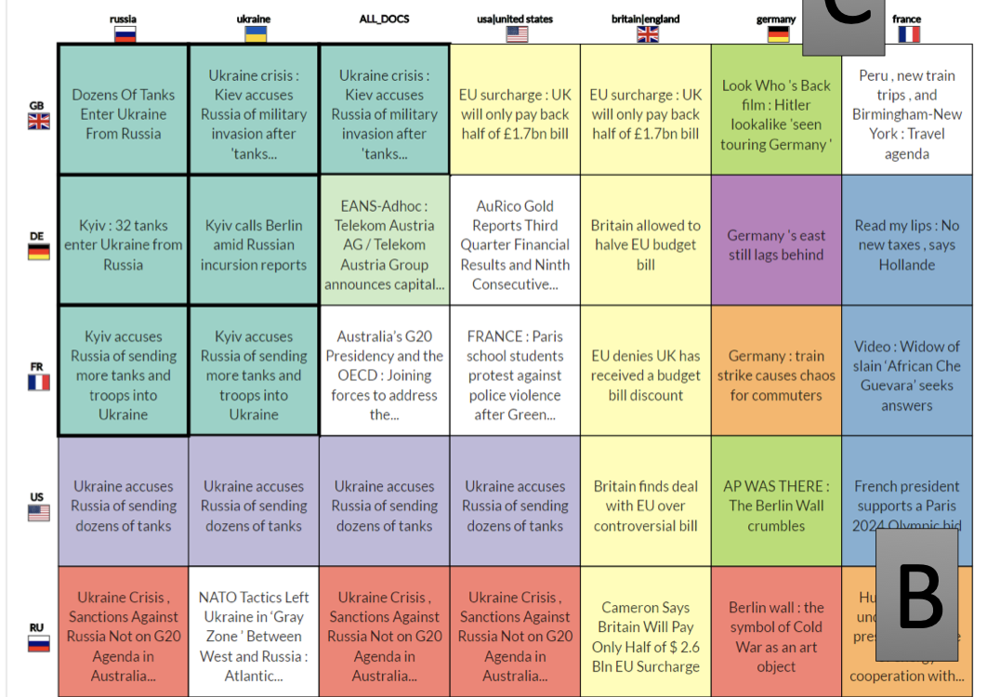

In [ ]:
# import plotly.express as px

# fig = px.pie(df_polarity.reset_index(), values='percentage', names='index')
# fig.update_traces(textposition='inside', textfont_size=14,)
# fig.show()

References:
1. Sentiment Analysis on Reddit News Headlines with Python’s Natural Language Toolkit (NLTK) https://www.learndatasci.com/tutorials/sentiment-analysis-reddit-headlines-pythons-nltk/m
2. Sentiment correlation in financial news networks and associated market movements https://www.nature.com/articles/s41598-021-82338-6

3. SENTIMENT ANALYSIS OF NEWS ARTICLES USING MACHINE LEARNING APPROACH
http://www.iraj.in/journal/journal_file/journal_pdf/12-127-1430132488114-116.pdf

4. Prediction of stock values changes using sentiment analysis of stock news headlines
https://publications.jrc.ec.europa.eu/repository/handle/JRC57132

5. Classify text with BERT https://www.tensorflow.org/text/tutorials/classify_text_with_bert

6. Stock News Sentiment Analysis with Python! https://towardsdatascience.com/stock-news-sentiment-analysis-with-python-193d4b4378d4

7. The Stanford CoreNLP Natural Language Processing Toolkit https://nlp.stanford.edu/pubs/StanfordCoreNlp2014.pdf

8. Recursive Deep Models for Semantic Compositionality Over a Sentiment Treebank https://nlp.stanford.edu/~socherr/EMNLP2013_RNTN.pdf

9. Matrix Based News Analysis https://www.gipp.com/wp-content/papercite-data/pdf/hamborg2018b.pdf

10. GPR ICRG Methodology https://www.prsgroup.com/wp-content/uploads/2014/08/icrgmethodology.pdf

11. Sentiment Analysis of Political News articles and the effect of negation scope https://www.irjet.net/archives/V3/i10/IRJET-V3I10209.pdf

12. Geoplot: https://coderzcolumn.com/tutorials/data-science/geoviews-scatter-and-bubble-maps